In [22]:
import process_db
import h5py
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import random
random.seed(1)

rna_embeddings = np.loadtxt('./output/sce_10xPBMC_atac_skip_referenced_embeddings2.txt')
atac_embeddings = np.loadtxt('./output/sce_10xPBMC_rna_skip_referenced_embeddings.txt')
print(rna_embeddings.shape)
print(atac_embeddings.shape)
embeddings =  np.concatenate((rna_embeddings, atac_embeddings))
print(embeddings.shape)
embeddings=np.nan_to_num(embeddings)
tsne_results = TSNE(perplexity=30, n_iter = 1000).fit_transform(embeddings)
tsne_results.shape
df = pd.DataFrame()
df['tSNE1'] = tsne_results[:,0]
df['tSNE2'] = tsne_results[:,1]
print("done")


(30587, 64)
(30587, 64)
(61174, 64)


/home/jo10595/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/jo10595/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


done


In [23]:
#print(df['tSNE1'])
#print(df['tSNE2'])
#print(tsne_results.shape)
print(tsne_results)

[[ 29.849373   24.875889 ]
 [ 36.271843   15.446587 ]
 [  8.214518   28.625559 ]
 ...
 [-18.593433  -22.230951 ]
 [  2.6956153 -35.874382 ]
 [ 20.156183  -23.074965 ]]


0         scRNA-seq
1         scRNA-seq
2         scRNA-seq
3         scRNA-seq
4         scRNA-seq
            ...    
61169    scATAC-seq
61170    scATAC-seq
61171    scATAC-seq
61172    scATAC-seq
61173    scATAC-seq
Name: data, Length: 61174, dtype: object


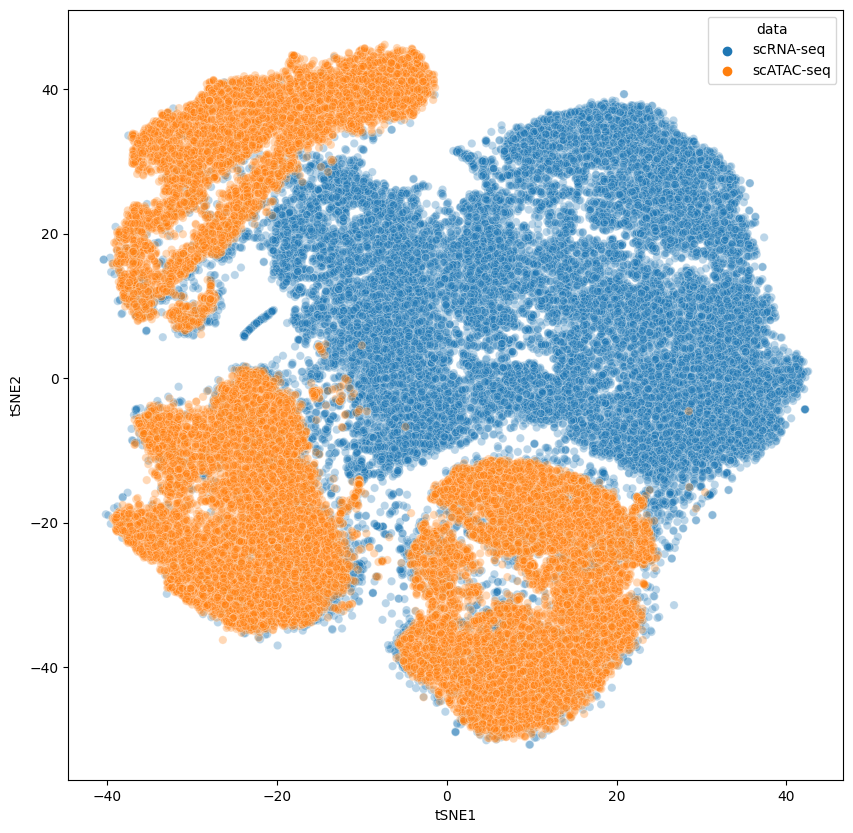

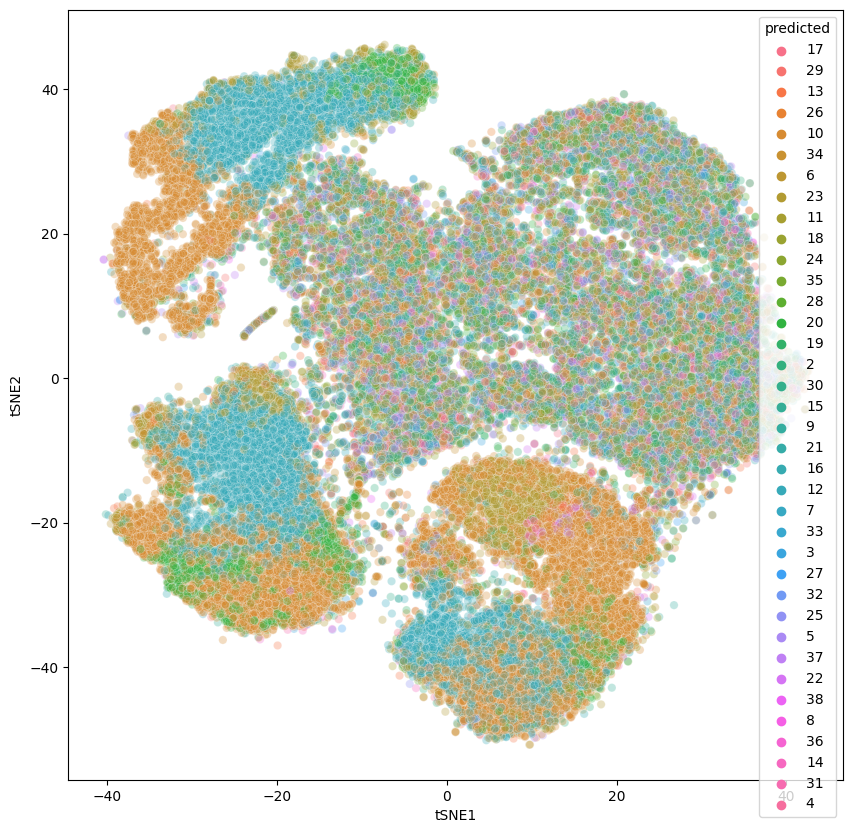

In [25]:
#print(df)
rna_labels = np.loadtxt('./data/maize_282.v8.3.scATAC_ALL_CELLs.metadata_reference_fixed2.txt')
atac_predictions = np.loadtxt('./output/sce_10xPBMC_rna_skip_referenced_knn_predictions.txt')
labels =  np.concatenate((rna_labels, atac_predictions))
#print(df.shape)
#print(len(rna_labels))
#print(len(atac_predictions))
#print(len(labels))
label_to_idx = pd.read_csv('./data/label_to_idx.txt', sep = '\t', header = None)
label_to_idx.shape
label_dic = []
for i in range(label_to_idx.shape[0]):
    label_dic = np.append(label_dic, label_to_idx[0][i][:-2])

#print(label_dic)
#print(len(label_dic))
#print(labels)
#print(label_dic[labels.astype(int)[39]])

#print(labels)
#print(len(labels))
#print(label_dic[labels.astype(int)])
#print(len(label_dic[labels.astype(int)]))
#for x in labels.astype(int):
#    print(x)
#    print(label_dic[x])

data_label = np.array(["scRNA-seq", "scATAC-seq"])
df['data'] = np.repeat(data_label, [rna_embeddings.shape[0], atac_embeddings.shape[0]], axis=0)
#print(len(labels.astype(int)))
print(df['data'])
#print(label_dic[labels.astype(int)])
#print(len(df['data']))
df['predicted'] = label_dic[labels.astype(int)]



plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched_skip_referenced.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched_skip_referenced.png")

In [28]:
print(df[df.data == "scRNA-seq"])
print(df[df.data == "scATAC-seq"])


           tSNE1      tSNE2       data predicted
0      29.849373  24.875889  scRNA-seq        17
1      36.271843  15.446587  scRNA-seq       29 
2       8.214518  28.625559  scRNA-seq        13
3      19.333658 -10.474790  scRNA-seq       26 
4       9.698013  14.566129  scRNA-seq        10
...          ...        ...        ...       ...
30582  20.177946   9.169109  scRNA-seq        13
30583  29.133255  18.569448  scRNA-seq        17
30584  31.499872  14.265192  scRNA-seq        6 
30585  34.649162   6.848846  scRNA-seq        11
30586  13.402057  34.605835  scRNA-seq       35 

[30587 rows x 4 columns]
           tSNE1      tSNE2        data predicted
30587 -22.987576 -11.648273  scATAC-seq        12
30588 -16.528736  42.960297  scATAC-seq        12
30589   2.546793 -42.305668  scATAC-seq        12
30590   0.560350 -32.280045  scATAC-seq        10
30591  -3.912316  41.894745  scATAC-seq       23 
...          ...        ...         ...       ...
61169 -20.987923 -31.231665  scATAC-

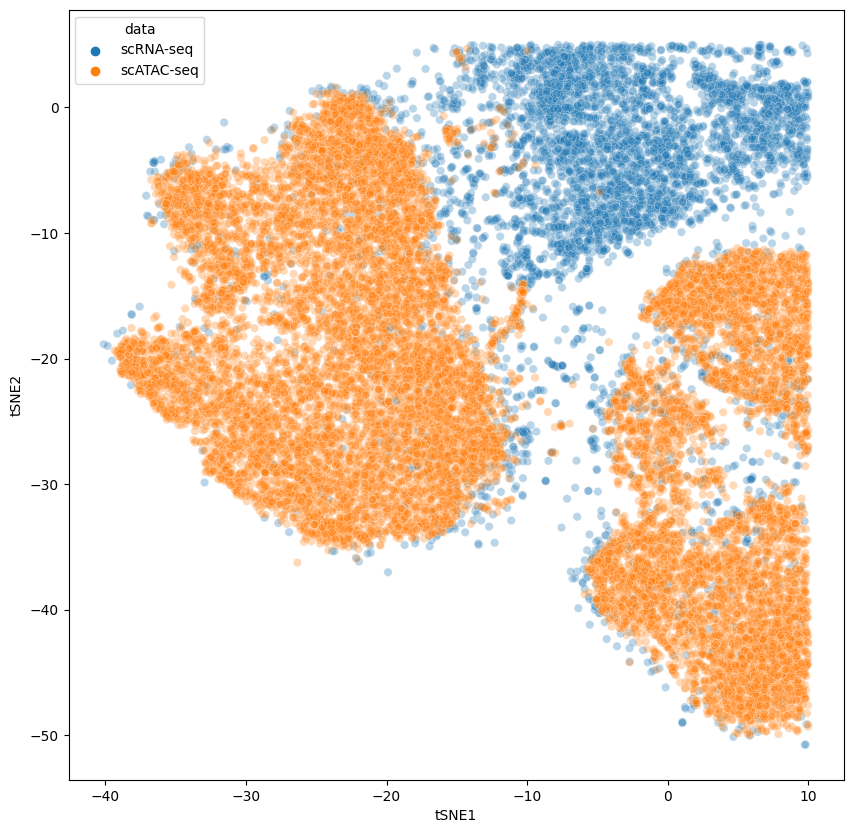

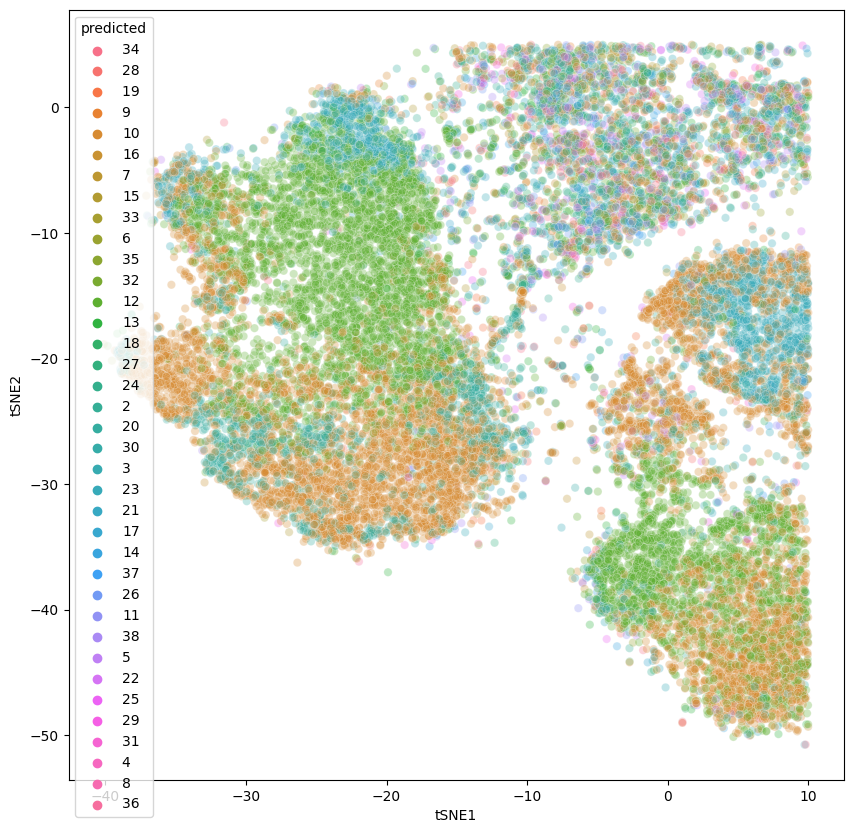

In [29]:
df_modi = df[df.tSNE1 < 10]
df_modi = df_modi[df_modi.tSNE2 < 5]
plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")

In [31]:
print(df_modi[df_modi.data == "scRNA-seq"])
print(df_modi[df_modi.data == "scATAC-seq"])

           tSNE1      tSNE2       data predicted
5       0.180875   0.722955  scRNA-seq       34 
14     -9.972199 -28.200422  scRNA-seq       28 
17    -10.762404  -3.314144  scRNA-seq       19 
28     -2.123292  -7.635679  scRNA-seq        9 
31    -19.986036   2.531744  scRNA-seq        10
...          ...        ...        ...       ...
30556  -7.079233  -0.005899  scRNA-seq       29 
30557   4.504122  -0.532207  scRNA-seq        17
30578  -6.437004   1.619846  scRNA-seq        13
30580 -14.058413   3.782720  scRNA-seq       23 
30581  -8.639071  -8.258732  scRNA-seq        12

[5252 rows x 4 columns]
           tSNE1      tSNE2        data predicted
30587 -22.987576 -11.648273  scATAC-seq        12
30589   2.546793 -42.305668  scATAC-seq        12
30590   0.560350 -32.280045  scATAC-seq        10
30592 -28.055803 -29.075155  scATAC-seq        10
30593 -24.766642  -3.177136  scATAC-seq        12
...          ...        ...         ...       ...
61165 -16.759415 -19.385159  scATAC-s

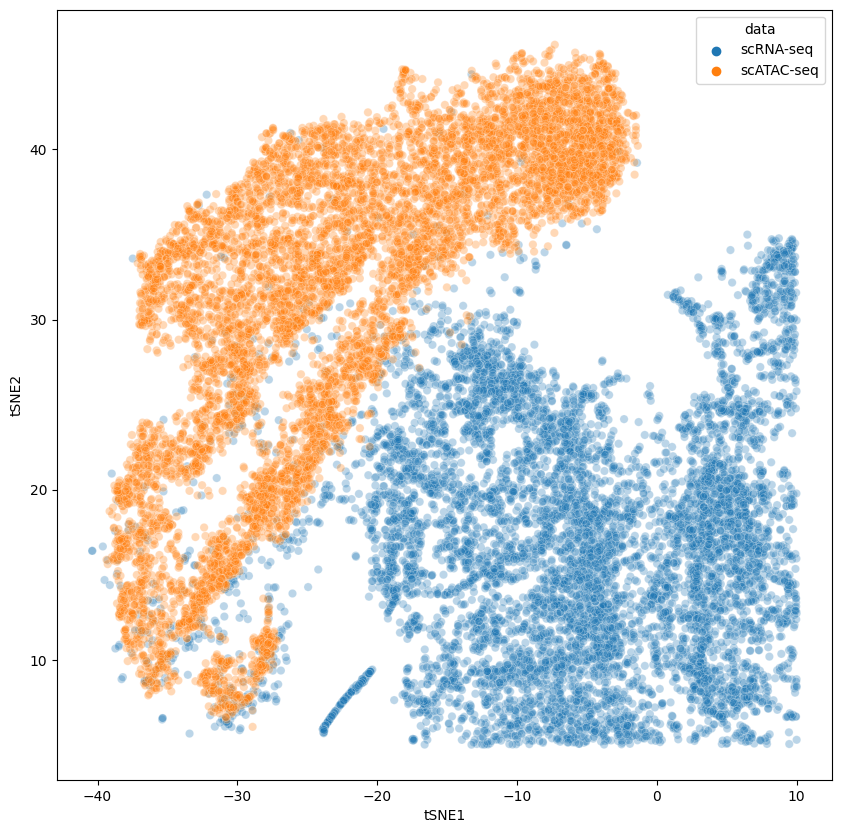

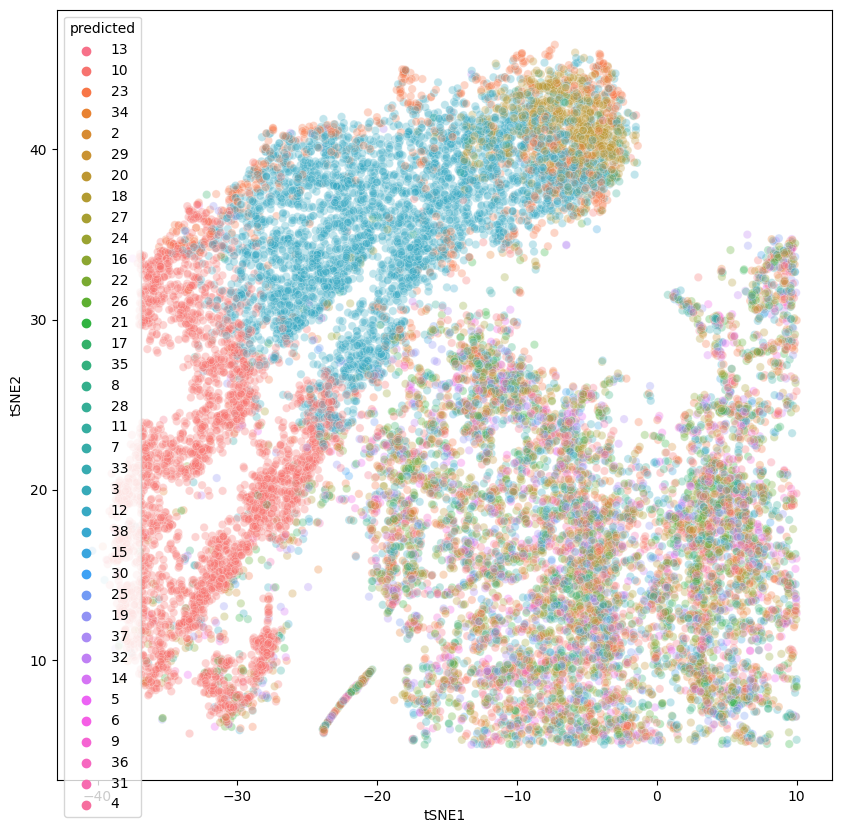

In [32]:
df_modi = df[df.tSNE1 < 10]
df_modi = df_modi[df_modi.tSNE2 > 5]
plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")

In [33]:
print(df_modi[df_modi.data == "scRNA-seq"])
print(df_modi[df_modi.data == "scATAC-seq"])

           tSNE1      tSNE2       data predicted
2       8.214518  28.625559  scRNA-seq        13
4       9.698013  14.566129  scRNA-seq        10
11    -12.985415  11.826142  scRNA-seq       23 
19     -7.831073  17.678762  scRNA-seq       34 
21    -11.017096  33.919666  scRNA-seq        2 
...          ...        ...        ...       ...
30569 -12.121535  27.879387  scRNA-seq       33 
30571   9.266137  19.370617  scRNA-seq       21 
30573  -7.193857  21.246719  scRNA-seq       19 
30574  -6.554780  23.177578  scRNA-seq        13
30576 -12.950936  25.115625  scRNA-seq        7 

[8933 rows x 4 columns]
           tSNE1      tSNE2        data predicted
30588 -16.528736  42.960297  scATAC-seq        12
30591  -3.912316  41.894745  scATAC-seq       23 
30597  -6.114657  39.772942  scATAC-seq        12
30601  -7.369912  44.320889  scATAC-seq       20 
30602 -18.805214  38.530918  scATAC-seq        12
...          ...        ...         ...       ...
61156 -17.213057  41.628025  scATAC-s

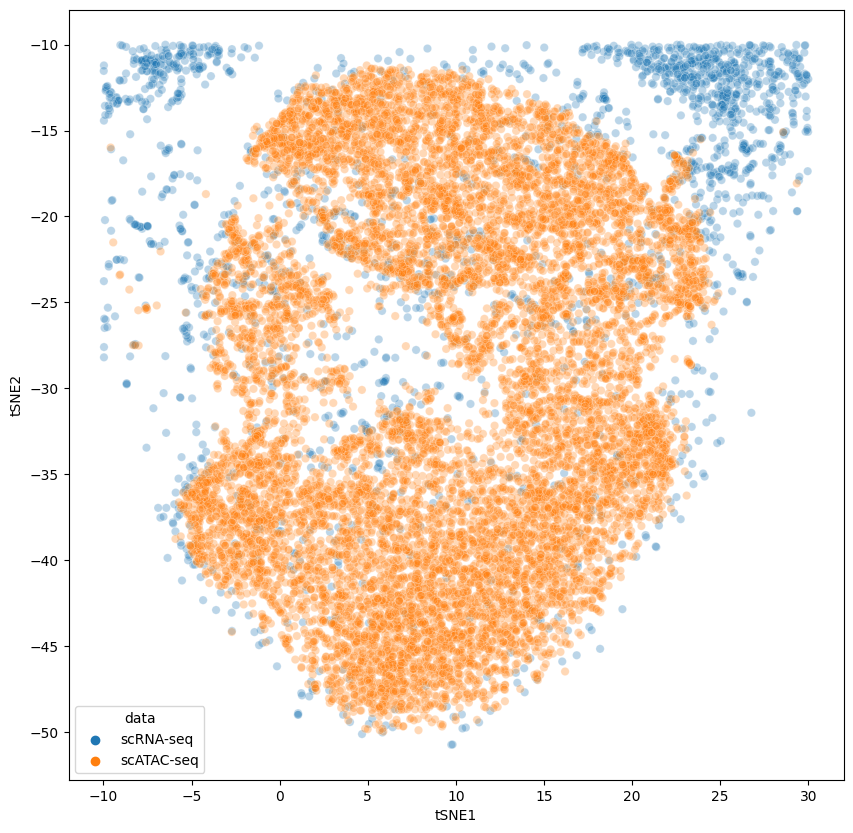

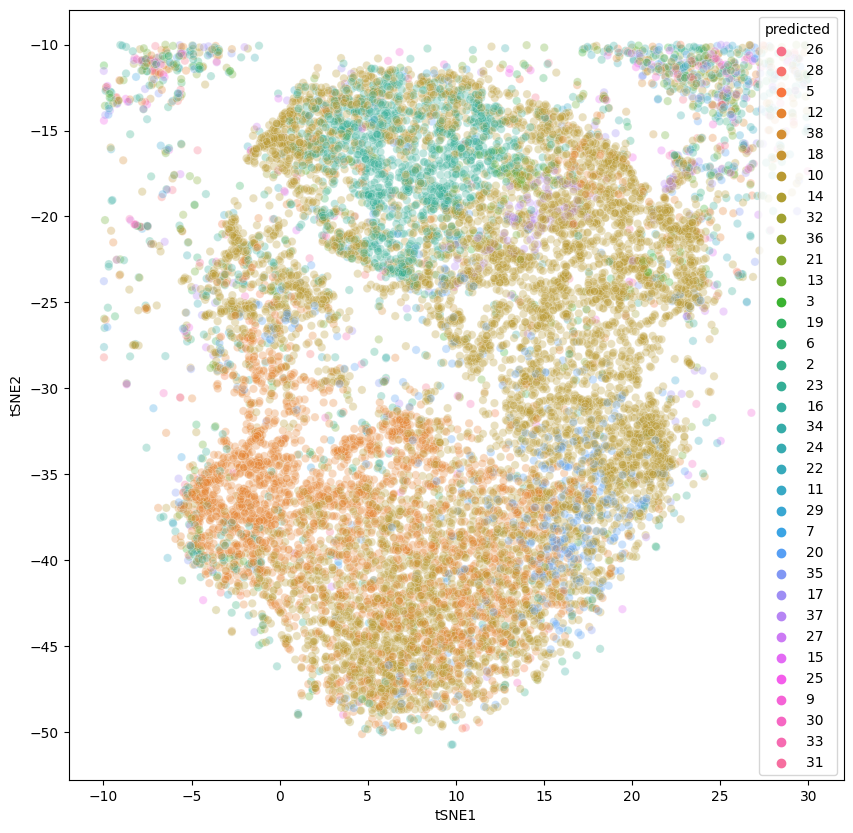

In [38]:
df_modi = df[df.tSNE1 < 30]
df_modi = df_modi[df_modi.tSNE1 > -10]

df_modi = df_modi[df_modi.tSNE2 < -10]
plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")

In [39]:
print(df_modi[df_modi.data == "scRNA-seq"])
print(df_modi[df_modi.data == "scATAC-seq"])

           tSNE1      tSNE2       data predicted
3      19.333658 -10.474790  scRNA-seq       26 
14     -9.972199 -28.200422  scRNA-seq       28 
83     26.727577 -18.065649  scRNA-seq        5 
87     27.512911 -10.082315  scRNA-seq        12
100    28.099693 -16.610067  scRNA-seq       38 
...          ...        ...        ...       ...
30460   9.468975 -36.900928  scRNA-seq       32 
30462  20.870296 -11.556698  scRNA-seq        18
30485  -9.683300 -13.715510  scRNA-seq       22 
30517   1.263645 -47.884018  scRNA-seq        18
30548  -1.282358 -32.279655  scRNA-seq        18

[1910 rows x 4 columns]
           tSNE1      tSNE2        data predicted
30589   2.546793 -42.305668  scATAC-seq        12
30590   0.560350 -32.280045  scATAC-seq        10
30594  11.556178 -22.877918  scATAC-seq        10
30595  -0.174151 -16.618126  scATAC-seq        10
30596  19.389139 -36.503078  scATAC-seq        10
...          ...        ...         ...       ...
61158   5.019872 -20.895750  scATAC-s

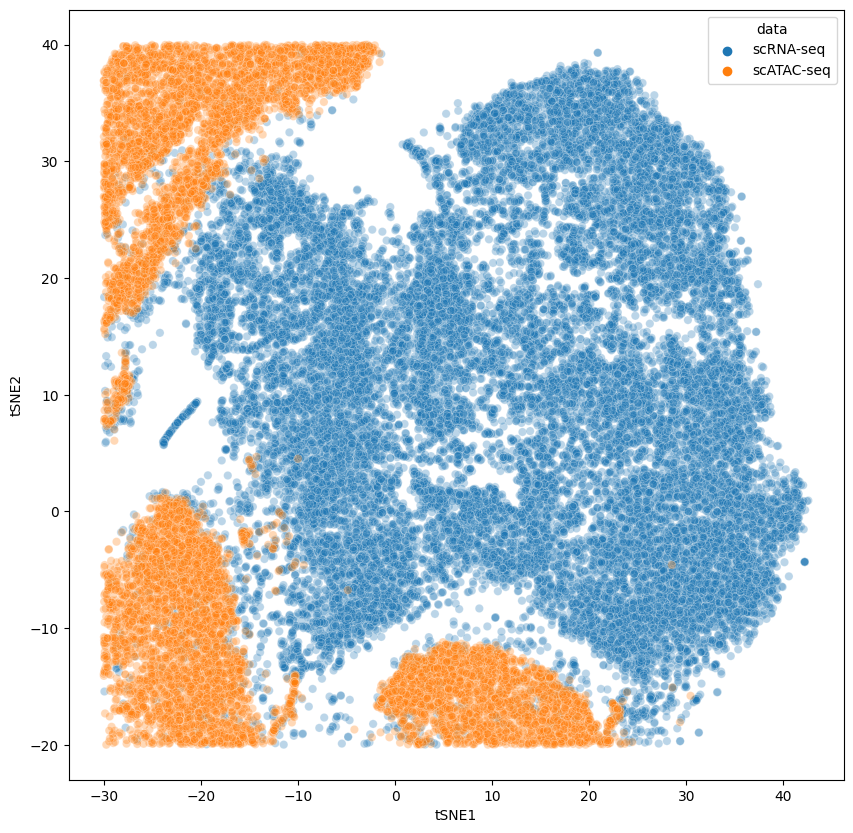

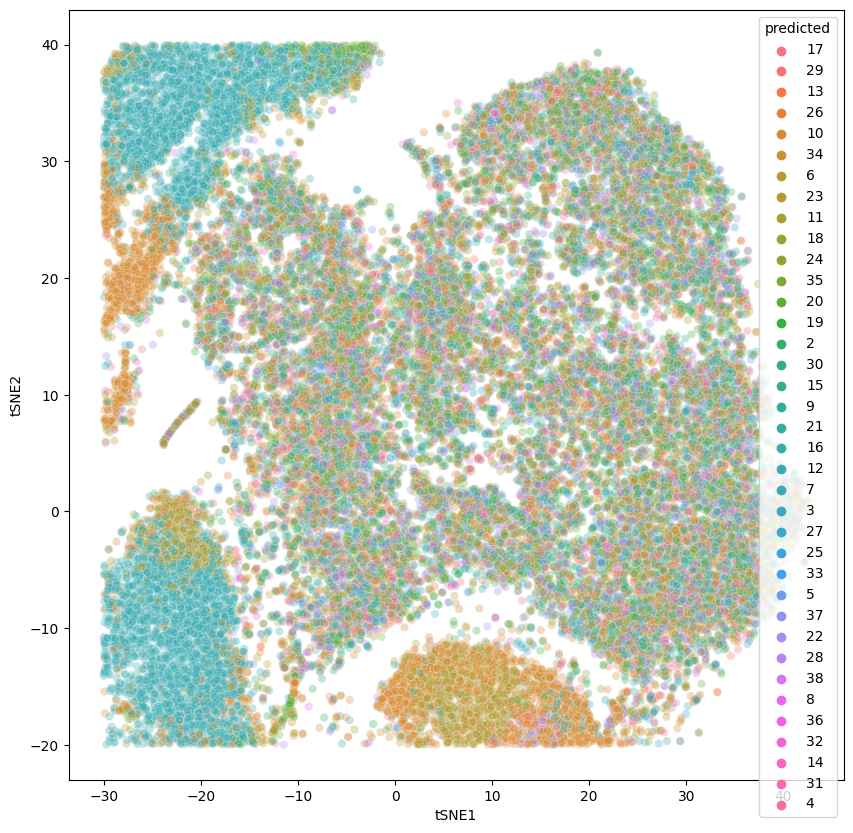

In [47]:
df_modi = df
df_modi = df_modi[df_modi.tSNE1 > -30]

df_modi = df_modi[df_modi.tSNE2 < 40]
df_modi = df_modi[df_modi.tSNE2 > -20]

#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")

In [48]:
print(df_modi[df_modi.data == "scRNA-seq"])
print(df_modi[df_modi.data == "scATAC-seq"])

           tSNE1      tSNE2       data predicted
0      29.849373  24.875889  scRNA-seq        17
1      36.271843  15.446587  scRNA-seq       29 
2       8.214518  28.625559  scRNA-seq        13
3      19.333658 -10.474790  scRNA-seq       26 
4       9.698013  14.566129  scRNA-seq        10
...          ...        ...        ...       ...
30582  20.177946   9.169109  scRNA-seq        13
30583  29.133255  18.569448  scRNA-seq        17
30584  31.499872  14.265192  scRNA-seq        6 
30585  34.649162   6.848846  scRNA-seq        11
30586  13.402057  34.605835  scRNA-seq       35 

[29365 rows x 4 columns]
           tSNE1      tSNE2        data predicted
30587 -22.987576 -11.648273  scATAC-seq        12
30593 -24.766642  -3.177136  scATAC-seq        12
30595  -0.174151 -16.618126  scATAC-seq        10
30597  -6.114657  39.772942  scATAC-seq        12
30602 -18.805214  38.530918  scATAC-seq        12
...          ...        ...         ...       ...
61161 -20.027048  38.064144  scATAC-

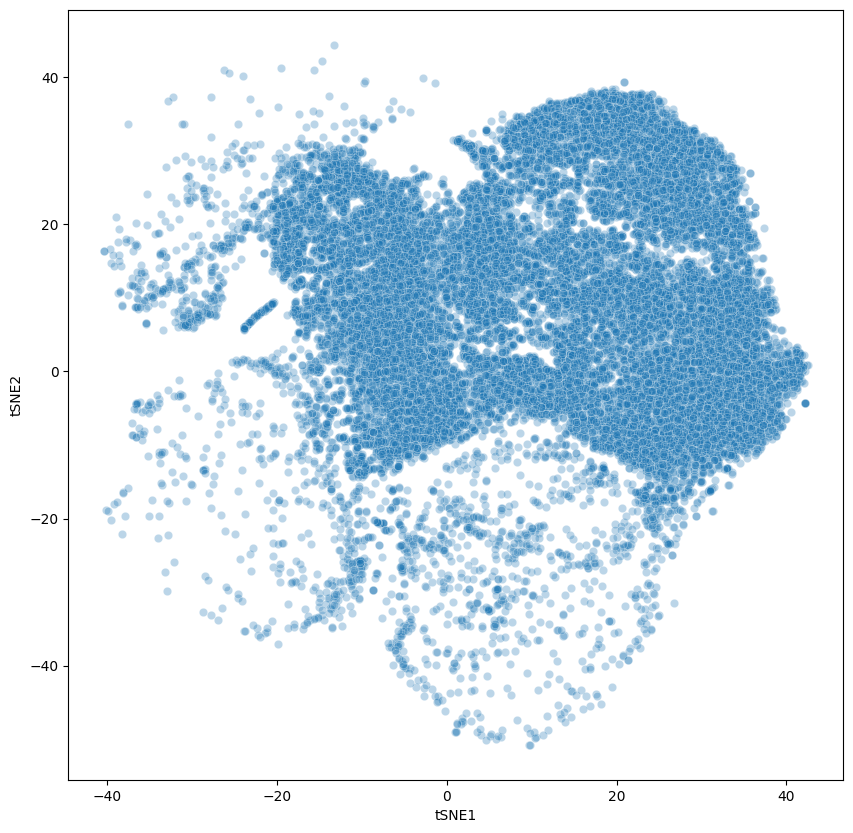

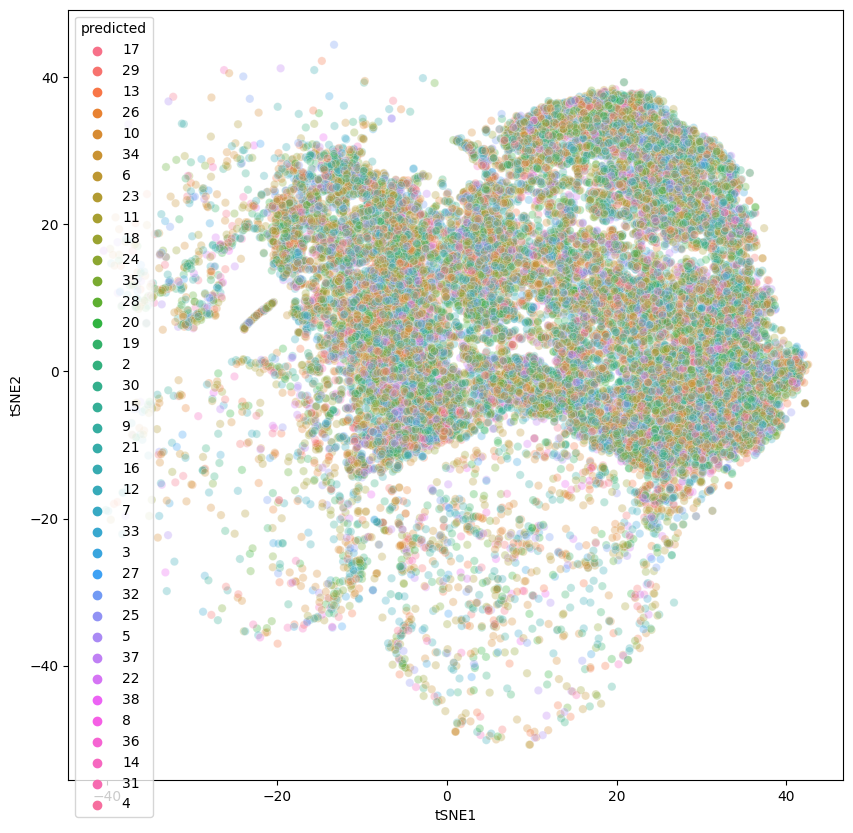

In [51]:
df_modi = df[df.data == "scRNA-seq"]

#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")

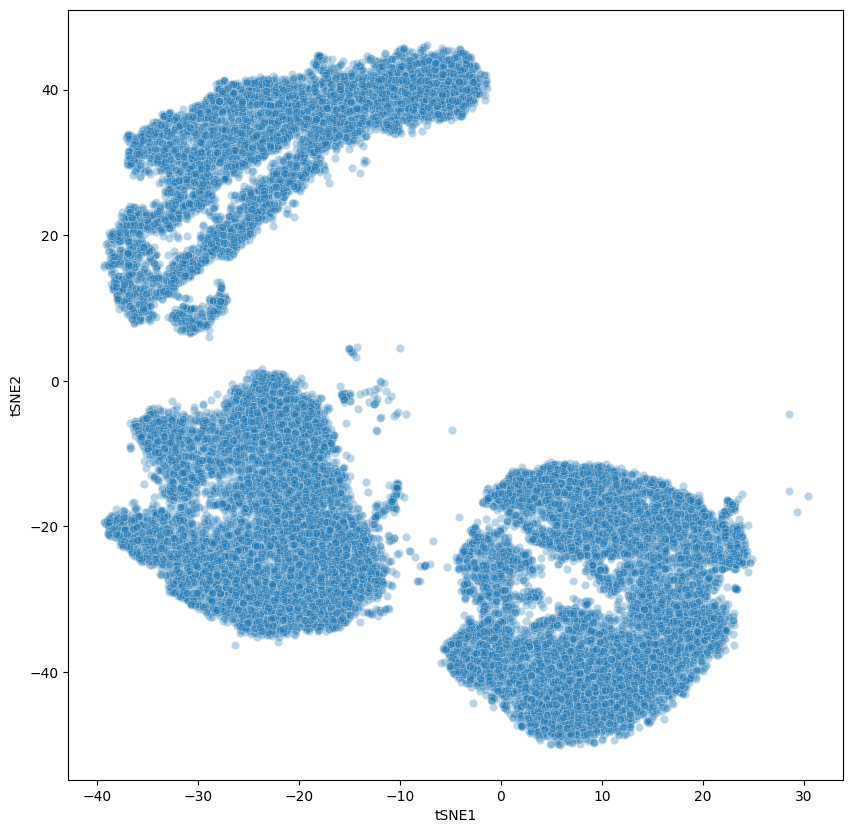

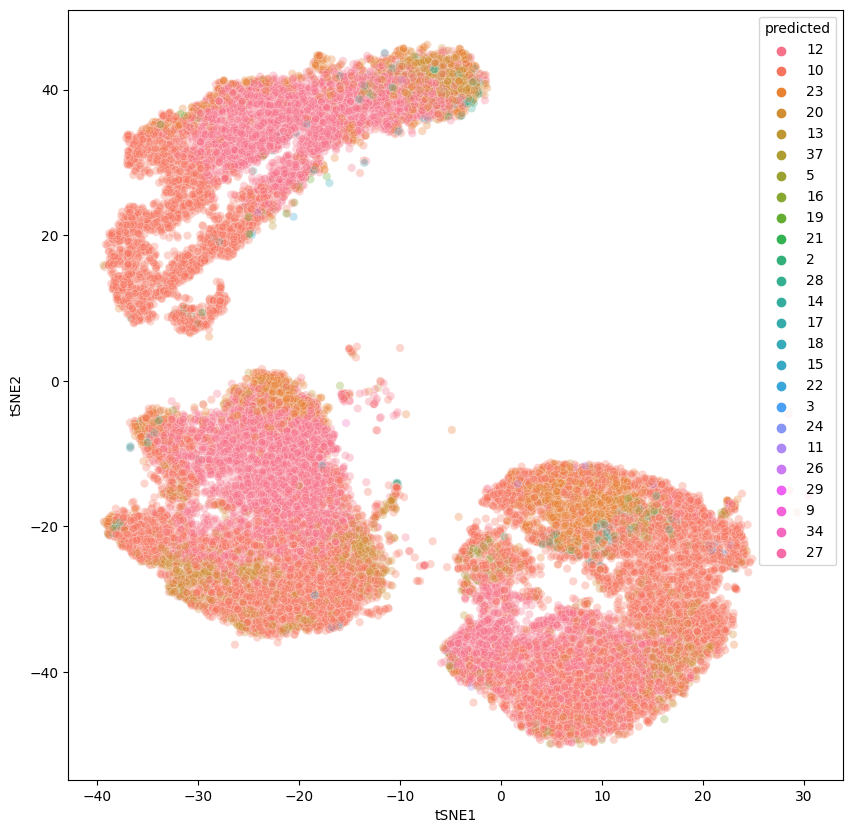

In [52]:
df_modi = df[df.data == "scATAC-seq"]

#df_modi = df_modi[df_modi.tSNE2 > -10]

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    #hue = "data",
    palette = sns.color_palette("tab10", 2),
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_data_switched.png")

plt.figure(figsize=(10,10))
sns.scatterplot(
    x = "tSNE1", y = "tSNE2",
    hue = "predicted",
    data = df_modi,
    legend = "full",
    alpha = 0.3
)
plt.savefig("sc_predicted_switched.png")